In [2]:
import pandas as pd
from scipy import stats
import numpy as np
import matplotlib.pyplot as plt
from pylab import *
import seaborn as sns
%matplotlib inline
import  statsmodels.api as sm
import statsmodels.stats.api as sms
from scipy.stats import boxcox

In [3]:
warbat = pd.read_csv('/Users/alexthompson/Desktop/war_daily_bat.csv')

In [23]:
warbat.head()

,name_common,age,mlb_ID,player_ID,year_ID,team_ID,stint_ID,lg_ID,PA,G,...,oppRpG_rep,pyth_exponent,pyth_exponent_rep,waa_win_perc,waa_win_perc_off,waa_win_perc_def,waa_win_perc_rep,OPS_plus,TOB_lg,TB_lg
3,David Aardsma,26.0,430911.0,aardsda01,2008,BOS,1,AL,1.0,5,...,4.69650,1.893,1.894,0.4970,0.4970,0.5000,0.4992,-100.0000,0.345,0.434
54,Andy Abad,33.0,407577.0,abadan01,2006,CIN,1,NL,5.0,5,...,4.83558,1.909,1.911,0.4929,0.4929,0.5002,0.4969,14.8106,1.742,1.349
57,Fernando Abad,26.0,472551.0,abadfe01,2012,HOU,1,NL,7.0,36,...,4.28341,1.844,1.845,0.4987,0.4987,0.5000,0.4993,-21.7251,2.286,2.896
156,Reggie Abercrombie,25.0,430631.0,abercre01,2006,FLA,1,NL,281.0,111,...,4.78784,1.907,1.908,0.4862,0.4897,0.4972,0.4922,57.6658,93.100,110.236
163,Brent Abernathy,25.0,150466.0,abernbr01,2003,TBD,1,AL,7.0,2,...,4.77262,1.872,1.910,0.4698,0.4196,0.5525,0.4870,-100.0000,2.290,2.934


In [4]:
warbat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 107049 entries, 0 to 107048
Data columns (total 49 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   name_common         107049 non-null  object 
 1   age                 106896 non-null  float64
 2   mlb_ID              107001 non-null  float64
 3   player_ID           107049 non-null  object 
 4   year_ID             107049 non-null  int64  
 5   team_ID             107049 non-null  object 
 6   stint_ID            107049 non-null  int64  
 7   lg_ID               106313 non-null  object 
 8   PA                  106880 non-null  float64
 9   G                   107049 non-null  int64  
 10  Inn                 70792 non-null   float64
 11  runs_bat            107049 non-null  float64
 12  runs_br             107049 non-null  float64
 13  runs_dp             107049 non-null  float64
 14  runs_field          107049 non-null  float64
 15  runs_infield        70792 non-null

In [4]:
warbat.dropna(inplace=True)

In [13]:
warbat['WAR'].corr(warbat['salary'])

0.1948571236939652

In [5]:
warbat.corr()

,age,mlb_ID,year_ID,stint_ID,PA,G,Inn,runs_bat,runs_br,runs_dp,...,oppRpG_rep,pyth_exponent,pyth_exponent_rep,waa_win_perc,waa_win_perc_off,waa_win_perc_def,waa_win_perc_rep,OPS_plus,TOB_lg,TB_lg
age,1.000000,-0.581231,-0.075197,0.046991,-0.009457,0.006947,-0.023781,-0.010376,-0.102498,-0.098667,...,0.033657,0.021490,0.035329,-0.064192,-0.045709,-0.097002,-0.016216,0.030739,-0.007002,-0.012499
mlb_ID,-0.581231,1.000000,0.720339,0.044515,-0.041494,-0.042934,-0.033035,-0.013388,0.061935,0.072893,...,-0.301396,-0.297028,-0.306609,0.019135,0.003240,0.061461,0.036911,-0.057206,-0.055381,-0.045229
year_ID,-0.075197,0.720339,1.000000,0.089895,-0.006257,-0.015063,-0.001924,0.000473,-0.005236,-0.004914,...,-0.392397,-0.374738,-0.391564,-0.002972,-0.004210,0.005428,-0.039257,-0.016801,-0.023173,-0.011306
stint_ID,0.046991,0.044515,0.089895,1.000000,-0.067304,-0.083300,-0.075290,-0.007010,-0.012027,0.004581,...,-0.081171,-0.079516,-0.080969,-0.010355,-0.008606,-0.012718,-0.010117,0.015602,-0.068039,-0.067624
PA,-0.009457,-0.041494,-0.006257,-0.067304,1.000000,0.950652,0.991846,0.412336,0.108255,-0.043418,...,-0.098056,0.117258,-0.031340,0.280231,0.284278,0.021198,-0.781133,0.594327,0.998983,0.997327
G,0.006947,-0.042934,-0.015063,-0.083300,0.950652,1.000000,0.937974,0.343498,0.085530,-0.033946,...,-0.100130,0.087446,-0.045756,0.270325,0.271228,0.022070,-0.636535,0.573691,0.949435,0.948816
Inn,-0.023781,-0.033035,-0.001924,-0.075290,0.991846,0.937974,1.000000,0.394188,0.094959,-0.051123,...,-0.092331,0.122354,-0.024936,0.278257,0.277811,0.038333,-0.789884,0.573077,0.989893,0.989090
runs_bat,-0.010376,-0.013388,0.000473,-0.007010,0.412336,0.343498,0.394188,1.000000,0.032840,-0.121106,...,-0.028420,0.171271,-0.005944,0.476573,0.518923,-0.119341,-0.267044,0.352052,0.415329,0.387854
runs_br,-0.102498,0.061935,-0.005236,-0.012027,0.108255,0.085530,0.094959,0.032840,1.000000,0.302944,...,0.004672,0.051545,0.009513,0.157155,0.126796,0.142092,-0.055409,0.020025,0.107872,0.113125
runs_dp,-0.098667,0.072893,-0.004914,0.004581,-0.043418,-0.033946,-0.051123,-0.121106,0.302944,1.000000,...,0.007153,0.004931,0.002636,0.050484,0.024209,0.083176,0.054296,-0.051608,-0.045260,-0.042783


In [6]:
warbat.corr(method='pearson').style.format("{:.2}").background_gradient(cmap=plt.get_cmap('coolwarm'), axis=1)

In [6]:
for col in warbat.columns: 
    print(col)

name_common
age
mlb_ID
player_ID
year_ID
team_ID
stint_ID
lg_ID
PA
G
Inn
runs_bat
runs_br
runs_dp
runs_field
runs_infield
runs_outfield
runs_catcher
runs_good_plays
runs_defense
runs_position
runs_position_p
runs_replacement
runs_above_rep
runs_above_avg
runs_above_avg_off
runs_above_avg_def
WAA
WAA_off
WAA_def
WAR
WAR_def
WAR_off
WAR_rep
salary
pitcher
teamRpG
oppRpG
oppRpPA_rep
oppRpG_rep
pyth_exponent
pyth_exponent_rep
waa_win_perc
waa_win_perc_off
waa_win_perc_def
waa_win_perc_rep
OPS_plus
TOB_lg
TB_lg


In [7]:
warbat1 = warbat[['WAR', 'WAR_def', 'WAR_off', 'WAR_rep', 'salary']]

In [24]:
warbat1.head()

,WAR,WAR_def,WAR_off,WAR_rep,salary
3,-0.02,0.00,-0.02,0.00,403250.0
54,-0.02,0.00,-0.02,0.02,327000.0
57,-0.05,0.01,-0.05,0.00,485000.0
156,-0.74,-0.35,-0.34,0.84,327000.0
163,-0.03,0.11,-0.13,0.03,300000.0


In [9]:
warbat1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10891 entries, 3 to 107014
Data columns (total 5 columns):
WAR        10891 non-null float64
WAR_def    10891 non-null float64
WAR_off    10891 non-null float64
WAR_rep    10891 non-null float64
salary     10891 non-null float64
dtypes: float64(5)
memory usage: 510.5 KB


In [10]:
warbat1.corr()

,WAR,WAR_def,WAR_off,WAR_rep,salary
WAR,1.000000,0.369384,0.932937,0.698884,0.194857
WAR_def,0.369384,1.000000,0.061076,0.034895,-0.116321
WAR_off,0.932937,0.061076,1.000000,0.747398,0.233491
WAR_rep,0.698884,0.034895,0.747398,1.000000,0.188674
salary,0.194857,-0.116321,0.233491,0.188674,1.000000


In [8]:
warbat1.corr(method='pearson').style.format("{:.2}").background_gradient(cmap=plt.get_cmap('coolwarm'), axis=1)

,WAR,WAR_def,WAR_off,WAR_rep,salary
WAR,1.0,0.37,0.93,0.7,0.19
WAR_def,0.37,1.0,0.061,0.035,-0.12
WAR_off,0.93,0.061,1.0,0.75,0.23
WAR_rep,0.7,0.035,0.75,1.0,0.19
salary,0.19,-0.12,0.23,0.19,1.0


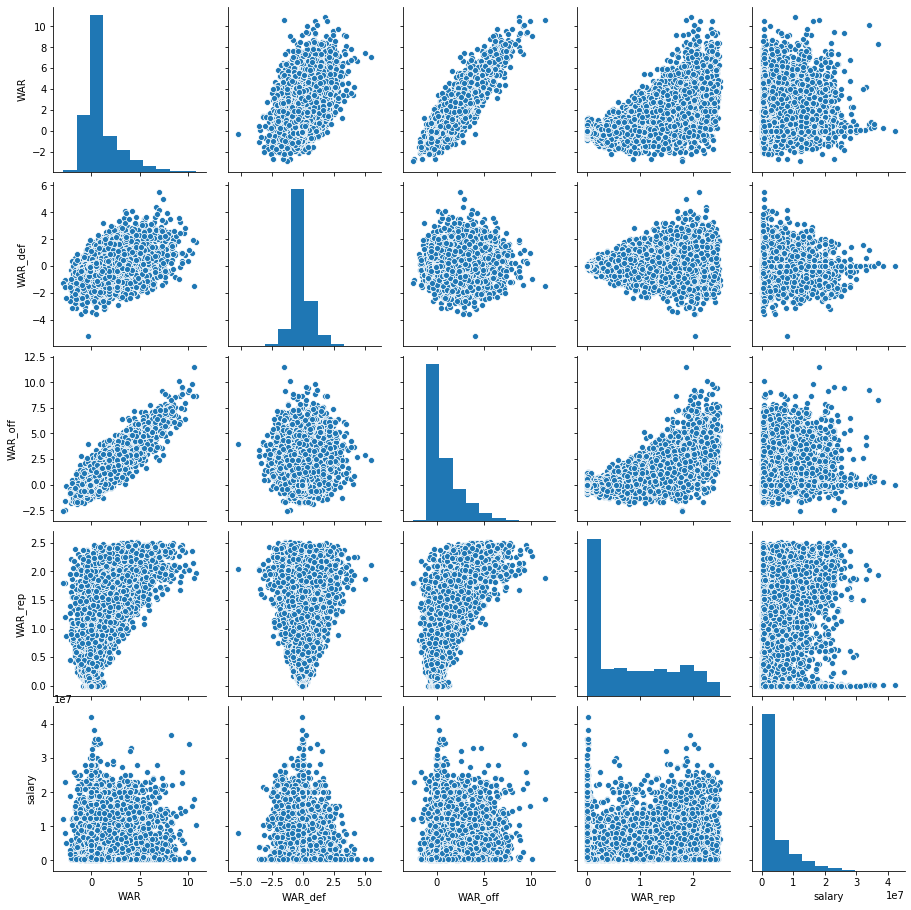

In [10]:
sns.pairplot(warbat1)

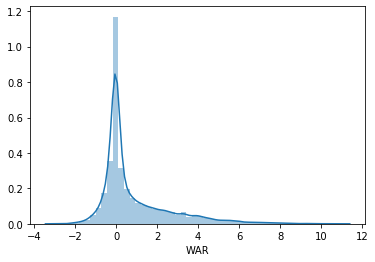

In [11]:
sns.distplot(warbat1["WAR"])

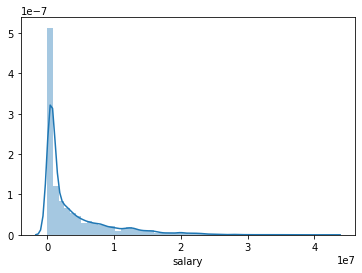

In [15]:
sns.distplot(warbat1["salary"])

In [25]:
stats.ttest_rel(warbat1['salary'], warbat1['WAR'])

Ttest_relResult(statistic=77.30480365433998, pvalue=0.0)

In [13]:
warbat1.WAR.describe()

count    10891.000000
mean         0.850481
std          1.714776
min         -2.910000
25%         -0.080000
50%          0.080000
75%          1.360000
max         10.860000
Name: WAR, dtype: float64

In [26]:
warbat1.salary.describe()

count    1.089100e+04
mean     3.880745e+06
std      5.238928e+06
min      1.000000e+00
25%      5.034000e+05
50%      1.290000e+06
75%      5.250000e+06
max      4.214300e+07
Name: salary, dtype: float64

In [9]:
warpitch = pd.read_csv('/Users/alexthompson/Desktop/war_daily_pitch.csv')

In [10]:
warpitch.head()

,name_common,age,mlb_ID,player_ID,year_ID,team_ID,stint_ID,lg_ID,G,GS,...,pyth_exponent,waa_win_perc,WAA,WAA_adj,oppRpG_rep,pyth_exponent_rep,waa_win_perc_rep,WAR_rep,ERA_plus,ER_lg
0,David Aardsma,22.0,430911.0,aardsda01,2004,SFG,1,NL,11,0,...,1.902,0.4803,-0.2167,-0.0298,4.75633,1.895,0.4914,0.0942,66.675000,5.334
1,David Aardsma,24.0,430911.0,aardsda01,2006,CHC,1,NL,45,0,...,1.909,0.5060,0.2700,-0.1301,4.97303,1.919,0.4896,0.4682,114.295833,27.431
2,David Aardsma,25.0,430911.0,aardsda01,2007,CHW,1,AL,25,0,...,1.924,0.4781,-0.5475,-0.1994,5.00394,1.920,0.4859,0.3459,74.086956,17.040
3,David Aardsma,26.0,430911.0,aardsda01,2008,BOS,1,AL,47,0,...,1.904,0.4836,-0.7708,-0.0631,4.81624,1.901,0.4888,0.5205,83.796667,25.139
4,David Aardsma,27.0,430911.0,aardsda01,2009,SEA,1,AL,73,0,...,1.899,0.5105,0.7665,0.1581,4.90529,1.911,0.4894,0.7666,168.910000,33.782


In [11]:
warpitch.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47611 entries, 0 to 47610
Data columns (total 42 columns):
name_common              47611 non-null object
age                      47580 non-null float64
mlb_ID                   47595 non-null float64
player_ID                47611 non-null object
year_ID                  47611 non-null int64
team_ID                  47611 non-null object
stint_ID                 47611 non-null int64
lg_ID                    47479 non-null object
G                        47611 non-null int64
GS                       47611 non-null int64
IPouts                   47611 non-null int64
IPouts_start             43796 non-null float64
IPouts_relief            43796 non-null float64
RA                       47611 non-null int64
xRA                      47611 non-null float64
xRA_sprp_adj             47513 non-null float64
xRA_def_pitcher          47611 non-null float64
PPF                      47611 non-null int64
PPF_custom               43621 non-null float

In [12]:
warpitch.dropna(inplace=True)

In [13]:
warpitch['WAR'].corr(warpitch['salary'])

0.1394342506921203

In [14]:
warpitch.corr()

,age,mlb_ID,year_ID,stint_ID,G,GS,IPouts,IPouts_start,IPouts_relief,RA,...,pyth_exponent,waa_win_perc,WAA,WAA_adj,oppRpG_rep,pyth_exponent_rep,waa_win_perc_rep,WAR_rep,ERA_plus,ER_lg
age,1.000000,-0.151372,0.064524,0.056860,0.121429,-0.040989,-0.008391,-0.034088,0.082296,-0.021456,...,-0.028705,0.039660,0.016249,-0.004703,-0.038121,-0.022210,0.079201,-0.010465,0.045430,-0.005649
mlb_ID,-0.151372,1.000000,0.588173,0.008305,0.063420,-0.100626,-0.156149,-0.135053,-0.002686,-0.168050,...,-0.066082,-0.013877,-0.022808,0.008844,-0.168837,-0.134718,0.166573,-0.157595,0.033359,-0.146207
year_ID,0.064524,0.588173,1.000000,0.006724,0.159178,-0.142414,-0.221843,-0.210696,0.054027,-0.223420,...,-0.021077,-0.005299,-0.051446,0.034788,-0.166622,-0.097447,0.280140,-0.233236,0.052635,-0.181258
stint_ID,0.056860,0.008305,0.006724,1.000000,-0.086797,-0.063399,-0.085223,-0.062880,-0.034740,-0.090668,...,-0.035750,0.005781,-0.015678,0.028536,-0.048121,-0.047360,0.028062,-0.085325,0.053849,-0.089305
G,0.121429,0.063420,0.159178,-0.086797,1.000000,-0.092311,0.219148,-0.066750,0.791249,0.120682,...,-0.231694,0.318843,0.210743,-0.025068,-0.165813,-0.106838,0.301498,0.227678,0.353849,0.220131
GS,-0.040989,-0.100626,-0.142414,-0.063399,-0.092311,1.000000,0.921353,0.985955,-0.565125,0.904941,...,-0.231855,0.324738,0.316953,-0.304827,0.354786,0.176107,-0.876649,0.906564,-0.005750,0.914343
IPouts,-0.008391,-0.156149,-0.221843,-0.085223,0.219148,0.921353,1.000000,0.948793,-0.240584,0.916359,...,-0.338629,0.468894,0.456861,-0.295558,0.289327,0.128683,-0.768545,0.990693,0.136229,0.981079
IPouts_start,-0.034088,-0.135053,-0.210696,-0.062880,-0.066750,0.985955,0.948793,1.000000,-0.534884,0.896913,...,-0.272035,0.381124,0.396785,-0.307146,0.347547,0.167280,-0.875185,0.934439,0.030332,0.932391
IPouts_relief,0.082296,-0.002686,0.054027,-0.034740,0.791249,-0.565125,-0.240584,-0.534884,1.000000,-0.304892,...,-0.069869,0.083099,0.002794,0.153215,-0.294017,-0.169798,0.633485,-0.221373,0.271171,-0.240795
RA,-0.021456,-0.168050,-0.223420,-0.090668,0.120682,0.904941,0.916359,0.896913,-0.304892,1.000000,...,-0.081106,0.211969,0.120440,-0.352873,0.408057,0.258557,-0.766633,0.917509,-0.080971,0.932724


In [16]:
warpitch.corr(method='pearson').style.format("{:.2}").background_gradient(cmap=plt.get_cmap('coolwarm'), axis=1)

In [17]:
for col in warpitch.columns: 
    print(col)

name_common
age
mlb_ID
player_ID
year_ID
team_ID
stint_ID
lg_ID
G
GS
IPouts
IPouts_start
IPouts_relief
RA
xRA
xRA_sprp_adj
xRA_def_pitcher
PPF
PPF_custom
xRA_final
BIP
BIP_perc
RS_def_total
runs_above_avg
runs_above_avg_adj
runs_above_rep
RpO_replacement
GR_leverage_index_avg
WAR
salary
teamRpG
oppRpG
pyth_exponent
waa_win_perc
WAA
WAA_adj
oppRpG_rep
pyth_exponent_rep
waa_win_perc_rep
WAR_rep
ERA_plus
ER_lg


In [18]:
warpitch1 = warpitch[['WAR', 'WAA', 'ERA_plus', 'BIP', 'xRA', 'salary']]

In [19]:
warpitch1.head()

,WAR,WAA,ERA_plus,BIP,xRA,salary
0,-0.15,-0.2167,66.675000,44,5.967,300000.0
2,-0.40,-0.5475,74.086956,97,17.999,387500.0
3,-0.31,-0.7708,83.796667,139,26.131,403250.0
4,1.69,0.7665,168.910000,181,39.221,419000.0
5,0.68,0.1749,115.168421,126,24.938,2750000.0


In [20]:
warpitch1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17708 entries, 0 to 47610
Data columns (total 6 columns):
WAR         17708 non-null float64
WAA         17708 non-null float64
ERA_plus    17708 non-null float64
BIP         17708 non-null int64
xRA         17708 non-null float64
salary      17708 non-null float64
dtypes: float64(5), int64(1)
memory usage: 968.4 KB


In [21]:
warpitch1.corr()

,WAR,WAA,ERA_plus,BIP,xRA,salary
WAR,1.000000,0.947360,0.482984,0.642363,0.699451,0.139434
WAA,0.947360,1.000000,0.534687,0.379778,0.449840,0.121194
ERA_plus,0.482984,0.534687,1.000000,0.085667,0.133187,0.076626
BIP,0.642363,0.379778,0.085667,1.000000,0.981467,0.097836
xRA,0.699451,0.449840,0.133187,0.981467,1.000000,0.135878
salary,0.139434,0.121194,0.076626,0.097836,0.135878,1.000000


In [23]:
warpitch1.corr(method='pearson').style.format("{:.2}").background_gradient(cmap=plt.get_cmap('coolwarm'), axis=1)

,WAR,WAA,ERA_plus,BIP,xRA,salary
WAR,1.0,0.95,0.48,0.64,0.7,0.14
WAA,0.95,1.0,0.53,0.38,0.45,0.12
ERA_plus,0.48,0.53,1.0,0.086,0.13,0.077
BIP,0.64,0.38,0.086,1.0,0.98,0.098
xRA,0.7,0.45,0.13,0.98,1.0,0.14
salary,0.14,0.12,0.077,0.098,0.14,1.0


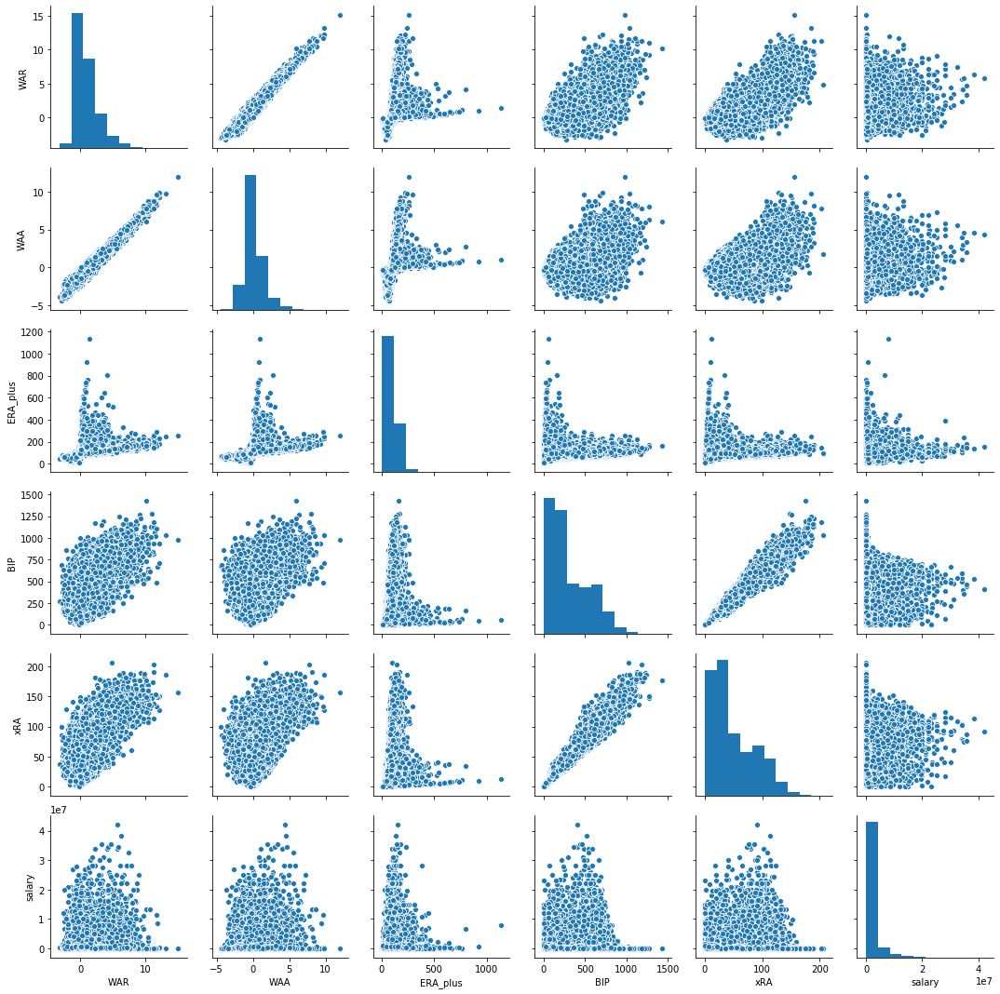

In [24]:
sns.pairplot(warpitch1)

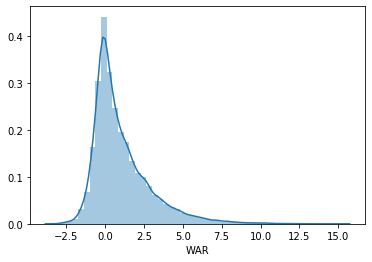

In [25]:
sns.distplot(warpitch1["WAR"])

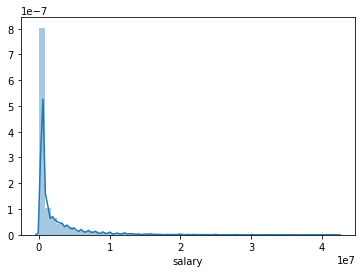

In [26]:
sns.distplot(warpitch1["salary"])

In [28]:
Batting = pd.read_csv('/Users/alexthompson/Desktop/batting.csv')

In [29]:
Batting.head()

,playerID,yearID,stint,teamID,lgID,G,AB,R,H,2B,...,RBI,SB,CS,BB,SO,IBB,HBP,SH,SF,GIDP
0,abercda01,1871,1,TRO,NaN,1,4,0,0,0,...,0.0,0.0,0.0,0,0.0,NaN,NaN,NaN,NaN,0.0
1,addybo01,1871,1,RC1,NaN,25,118,30,32,6,...,13.0,8.0,1.0,4,0.0,NaN,NaN,NaN,NaN,0.0
2,allisar01,1871,1,CL1,NaN,29,137,28,40,4,...,19.0,3.0,1.0,2,5.0,NaN,NaN,NaN,NaN,1.0
3,allisdo01,1871,1,WS3,NaN,27,133,28,44,10,...,27.0,1.0,1.0,0,2.0,NaN,NaN,NaN,NaN,0.0
4,ansonca01,1871,1,RC1,NaN,25,120,29,39,11,...,16.0,6.0,2.0,2,1.0,NaN,NaN,NaN,NaN,0.0


In [30]:
Batting.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 107429 entries, 0 to 107428
Data columns (total 22 columns):
playerID    107429 non-null object
yearID      107429 non-null int64
stint       107429 non-null int64
teamID      107429 non-null object
lgID        106691 non-null object
G           107429 non-null int64
AB          107429 non-null int64
R           107429 non-null int64
H           107429 non-null int64
2B          107429 non-null int64
3B          107429 non-null int64
HR          107429 non-null int64
RBI         106673 non-null float64
SB          105061 non-null float64
CS          83888 non-null float64
BB          107429 non-null int64
SO          105329 non-null float64
IBB         70778 non-null float64
HBP         104612 non-null float64
SH          101360 non-null float64
SF          71325 non-null float64
GIDP        81988 non-null float64
dtypes: float64(9), int64(10), object(3)
memory usage: 18.0+ MB


In [31]:
Batting.dropna(inplace=True)

In [32]:
Batting.corr()

,yearID,stint,G,AB,R,H,2B,3B,HR,RBI,SB,CS,BB,SO,IBB,HBP,SH,SF,GIDP
yearID,1.000000,0.016718,-0.006860,-0.030532,-0.006826,-0.023417,0.035027,-0.075224,0.032691,-0.001792,0.004635,-0.053053,-0.030869,0.061197,-0.069395,0.077911,-0.121213,-0.021007,-0.027068
stint,0.016718,1.000000,-0.136597,-0.103758,-0.097295,-0.099616,-0.096110,-0.068874,-0.078002,-0.093002,-0.059045,-0.068024,-0.090737,-0.099958,-0.070867,-0.070055,-0.075730,-0.079676,-0.089320
G,-0.006860,-0.136597,1.000000,0.932137,0.892743,0.917358,0.873184,0.655834,0.734802,0.866640,0.535928,0.634187,0.840982,0.838477,0.608420,0.612473,0.358393,0.755425,0.818425
AB,-0.030532,-0.103758,0.932137,1.000000,0.964383,0.990425,0.944559,0.710707,0.794696,0.932873,0.590437,0.683677,0.887750,0.891410,0.639591,0.656023,0.366942,0.808658,0.877498
R,-0.006826,-0.097295,0.892743,0.964383,1.000000,0.974021,0.939258,0.715505,0.846418,0.940971,0.632808,0.688875,0.914658,0.870629,0.647558,0.667895,0.300442,0.789540,0.824046
H,-0.023417,-0.099616,0.917358,0.990425,0.974021,1.000000,0.955461,0.720272,0.802195,0.941384,0.599513,0.685985,0.883817,0.861438,0.653486,0.652275,0.331821,0.808997,0.871824
2B,0.035027,-0.096110,0.873184,0.944559,0.939258,0.955461,1.000000,0.648287,0.799060,0.924660,0.535701,0.614622,0.853946,0.849879,0.631419,0.654781,0.262632,0.791433,0.838930
3B,-0.075224,-0.068874,0.655834,0.710707,0.715505,0.720272,0.648287,1.000000,0.467496,0.613238,0.618161,0.651821,0.597998,0.590454,0.412263,0.418661,0.323563,0.534250,0.541091
HR,0.032691,-0.078002,0.734802,0.794696,0.846418,0.802195,0.799060,0.467496,1.000000,0.923638,0.350329,0.413905,0.809481,0.828577,0.660689,0.602542,0.058452,0.701679,0.717625
RBI,-0.001792,-0.093002,0.866640,0.932873,0.940971,0.941384,0.924660,0.613238,0.923638,1.000000,0.467490,0.553878,0.884475,0.872792,0.696507,0.646711,0.202215,0.831903,0.849943


In [33]:
Batting.corr(method='pearson').style.format("{:.2}").background_gradient(cmap=plt.get_cmap('coolwarm'), axis=1)

,yearID,stint,G,AB,R,H,2B,3B,HR,RBI,SB,CS,BB,SO,IBB,HBP,SH,SF,GIDP
yearID,1.0,0.017,-0.0069,-0.031,-0.0068,-0.023,0.035,-0.075,0.033,-0.0018,0.0046,-0.053,-0.031,0.061,-0.069,0.078,-0.12,-0.021,-0.027
stint,0.017,1.0,-0.14,-0.1,-0.097,-0.1,-0.096,-0.069,-0.078,-0.093,-0.059,-0.068,-0.091,-0.1,-0.071,-0.07,-0.076,-0.08,-0.089
G,-0.0069,-0.14,1.0,0.93,0.89,0.92,0.87,0.66,0.73,0.87,0.54,0.63,0.84,0.84,0.61,0.61,0.36,0.76,0.82
AB,-0.031,-0.1,0.93,1.0,0.96,0.99,0.94,0.71,0.79,0.93,0.59,0.68,0.89,0.89,0.64,0.66,0.37,0.81,0.88
R,-0.0068,-0.097,0.89,0.96,1.0,0.97,0.94,0.72,0.85,0.94,0.63,0.69,0.91,0.87,0.65,0.67,0.3,0.79,0.82
H,-0.023,-0.1,0.92,0.99,0.97,1.0,0.96,0.72,0.8,0.94,0.6,0.69,0.88,0.86,0.65,0.65,0.33,0.81,0.87
2B,0.035,-0.096,0.87,0.94,0.94,0.96,1.0,0.65,0.8,0.92,0.54,0.61,0.85,0.85,0.63,0.65,0.26,0.79,0.84
3B,-0.075,-0.069,0.66,0.71,0.72,0.72,0.65,1.0,0.47,0.61,0.62,0.65,0.6,0.59,0.41,0.42,0.32,0.53,0.54
HR,0.033,-0.078,0.73,0.79,0.85,0.8,0.8,0.47,1.0,0.92,0.35,0.41,0.81,0.83,0.66,0.6,0.058,0.7,0.72
RBI,-0.0018,-0.093,0.87,0.93,0.94,0.94,0.92,0.61,0.92,1.0,0.47,0.55,0.88,0.87,0.7,0.65,0.2,0.83,0.85


In [36]:
Batting1 = Batting[['G', 'AB', 'R', 'H', '2B', '3B', 'HR', 'RBI', 'SB', 'CS', 'BB', 'SO', 'IBB', 'HBP', 'SH', 'SF', 'GIDP']]

In [48]:
Batting1.corr(method='pearson').style.format("{:.2}").background_gradient(cmap=plt.get_cmap('coolwarm'), axis=1)

,G,AB,R,H,2B,3B,HR,RBI,SB,CS,BB,SO,IBB,HBP,SH,SF,GIDP
G,1.0,0.93,0.89,0.92,0.87,0.66,0.73,0.87,0.54,0.63,0.84,0.84,0.61,0.61,0.36,0.76,0.82
AB,0.93,1.0,0.96,0.99,0.94,0.71,0.79,0.93,0.59,0.68,0.89,0.89,0.64,0.66,0.37,0.81,0.88
R,0.89,0.96,1.0,0.97,0.94,0.72,0.85,0.94,0.63,0.69,0.91,0.87,0.65,0.67,0.3,0.79,0.82
H,0.92,0.99,0.97,1.0,0.96,0.72,0.8,0.94,0.6,0.69,0.88,0.86,0.65,0.65,0.33,0.81,0.87
2B,0.87,0.94,0.94,0.96,1.0,0.65,0.8,0.92,0.54,0.61,0.85,0.85,0.63,0.65,0.26,0.79,0.84
3B,0.66,0.71,0.72,0.72,0.65,1.0,0.47,0.61,0.62,0.65,0.6,0.59,0.41,0.42,0.32,0.53,0.54
HR,0.73,0.79,0.85,0.8,0.8,0.47,1.0,0.92,0.35,0.41,0.81,0.83,0.66,0.6,0.058,0.7,0.72
RBI,0.87,0.93,0.94,0.94,0.92,0.61,0.92,1.0,0.47,0.55,0.88,0.87,0.7,0.65,0.2,0.83,0.85
SB,0.54,0.59,0.63,0.6,0.54,0.62,0.35,0.47,1.0,0.81,0.53,0.49,0.3,0.37,0.3,0.42,0.39
CS,0.63,0.68,0.69,0.69,0.61,0.65,0.41,0.55,0.81,1.0,0.6,0.56,0.37,0.42,0.35,0.5,0.5


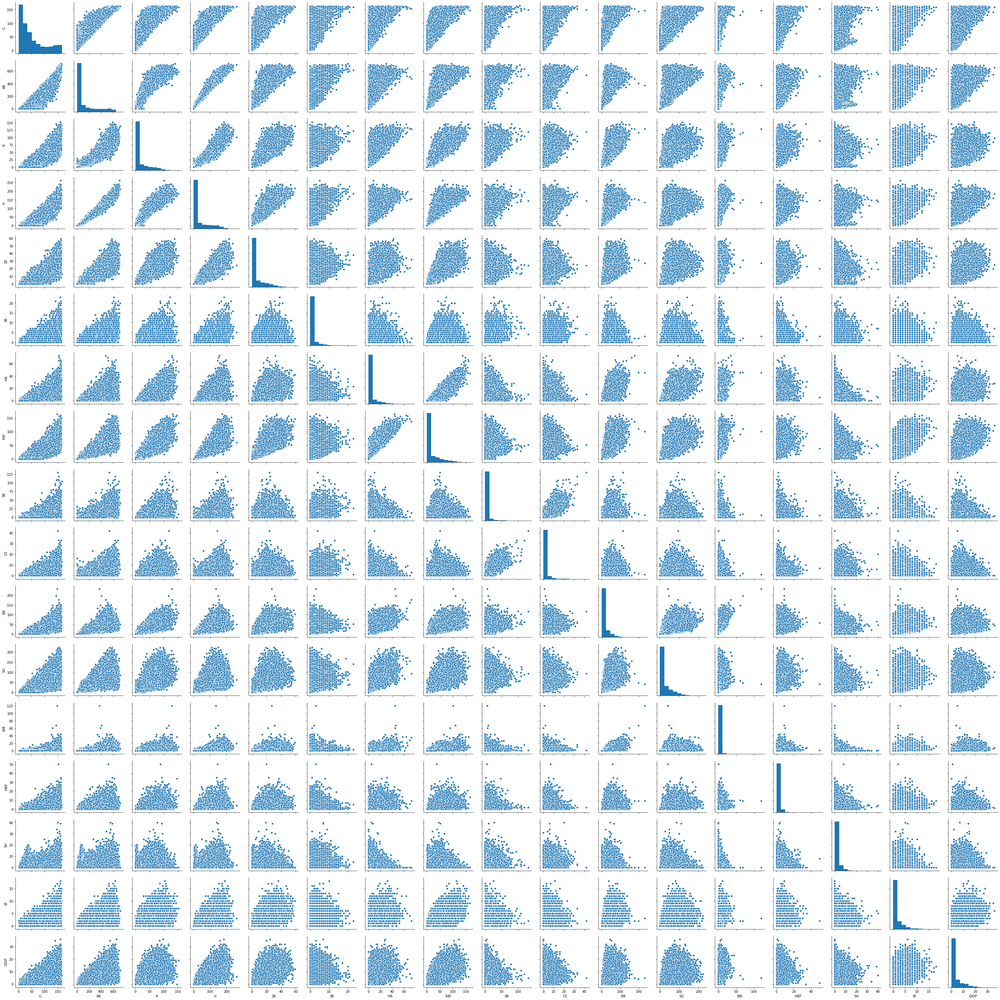

In [37]:
sns.pairplot(Batting1)

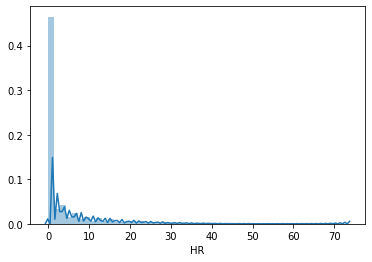

In [38]:
sns.distplot(Batting["HR"])

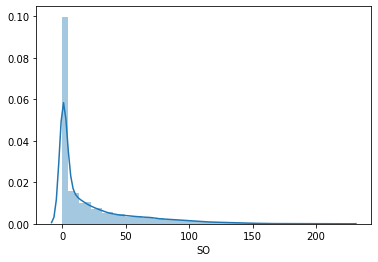

In [39]:
sns.distplot(Batting["SO"])

In [40]:
Pitching = pd.read_csv('/Users/alexthompson/Desktop/pitching.csv')

In [41]:
Pitching.head()

,playerID,yearID,stint,teamID,lgID,W,L,G,GS,CG,...,IBB,WP,HBP,BK,BFP,GF,R,SH,SF,GIDP
0,bechtge01,1871,1,PH1,NaN,1,2,3,3,2,...,NaN,7,NaN,0,146.0,0,42,NaN,NaN,NaN
1,brainas01,1871,1,WS3,NaN,12,15,30,30,30,...,NaN,7,NaN,0,1291.0,0,292,NaN,NaN,NaN
2,fergubo01,1871,1,NY2,NaN,0,0,1,0,0,...,NaN,2,NaN,0,14.0,0,9,NaN,NaN,NaN
3,fishech01,1871,1,RC1,NaN,4,16,24,24,22,...,NaN,20,NaN,0,1080.0,1,257,NaN,NaN,NaN
4,fleetfr01,1871,1,NY2,NaN,0,1,1,1,1,...,NaN,0,NaN,0,57.0,0,21,NaN,NaN,NaN


In [42]:
Pitching.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47628 entries, 0 to 47627
Data columns (total 30 columns):
playerID    47628 non-null object
yearID      47628 non-null int64
stint       47628 non-null int64
teamID      47628 non-null object
lgID        47496 non-null object
W           47628 non-null int64
L           47628 non-null int64
G           47628 non-null int64
GS          47628 non-null int64
CG          47628 non-null int64
SHO         47628 non-null int64
SV          47628 non-null int64
IPouts      47628 non-null int64
H           47628 non-null int64
ER          47628 non-null int64
HR          47628 non-null int64
BB          47628 non-null int64
SO          47628 non-null int64
BAOpp       43187 non-null float64
ERA         47534 non-null float64
IBB         33050 non-null float64
WP          47628 non-null int64
HBP         46894 non-null float64
BK          47628 non-null int64
BFP         47625 non-null float64
GF          47628 non-null int64
R           47628 no

In [44]:
Pitching.dropna(inplace=True)

In [45]:
Pitching.corr()

,yearID,stint,W,L,G,GS,CG,SHO,SV,IPouts,...,IBB,WP,HBP,BK,BFP,GF,R,SH,SF,GIDP
yearID,1.000000,0.031193,-0.157905,-0.180892,-0.005421,-0.128016,-0.324513,-0.238532,-0.032885,-0.197527,...,-0.292031,-0.089460,0.056544,-0.197567,-0.199756,-0.062870,-0.179667,-0.313984,-0.218044,-0.177375
stint,0.031193,1.000000,-0.128803,-0.144412,-0.151463,-0.112684,-0.059232,-0.051500,-0.053879,-0.154813,...,-0.113431,-0.108202,-0.121817,-0.072018,-0.156995,-0.075034,-0.154235,-0.120294,-0.127967,-0.139890
W,-0.157905,-0.128803,1.000000,0.729698,0.373658,0.838740,0.614931,0.571386,0.013436,0.921878,...,0.398372,0.554596,0.578773,0.323519,0.913299,-0.034269,0.819660,0.672087,0.650904,0.794693
L,-0.180892,-0.144412,0.729698,1.000000,0.343947,0.834844,0.518473,0.432162,0.034329,0.869578,...,0.447415,0.574430,0.590919,0.335171,0.881604,-0.022730,0.905677,0.696254,0.696769,0.767455
G,-0.005421,-0.151463,0.373658,0.343947,1.000000,0.066150,0.088294,0.075120,0.472154,0.409195,...,0.537295,0.352103,0.295857,0.143189,0.404934,0.686285,0.324096,0.364227,0.344120,0.358424
GS,-0.128016,-0.112684,0.838740,0.834844,0.066150,1.000000,0.598078,0.542886,-0.182096,0.915594,...,0.257202,0.548215,0.609567,0.336356,0.920071,-0.339902,0.913153,0.653118,0.668356,0.797133
CG,-0.324513,-0.059232,0.614931,0.518473,0.088294,0.598078,1.000000,0.780927,-0.083676,0.647042,...,0.227446,0.345840,0.266343,0.251688,0.635346,-0.164097,0.549816,0.499727,0.446202,0.548089
SHO,-0.238532,-0.051500,0.571386,0.432162,0.075120,0.542886,0.780927,1.000000,-0.077852,0.574661,...,0.198040,0.293104,0.253925,0.230580,0.560474,-0.153417,0.463100,0.441368,0.360458,0.479454
SV,-0.032885,-0.053879,0.013436,0.034329,0.472154,-0.182096,-0.083676,-0.077852,1.000000,0.012412,...,0.188344,0.040323,-0.023740,-0.015947,0.003496,0.872731,-0.066280,0.038910,-0.004863,-0.015362
IPouts,-0.197527,-0.154813,0.921878,0.869578,0.409195,0.915594,0.647042,0.574661,0.012412,1.000000,...,0.462736,0.624045,0.640156,0.368326,0.998338,-0.038321,0.938975,0.755134,0.744538,0.870294


In [46]:
Pitching.corr(method='pearson').style.format("{:.2}").background_gradient(cmap=plt.get_cmap('coolwarm'), axis=1)

,yearID,stint,W,L,G,GS,CG,SHO,SV,IPouts,H,ER,HR,BB,SO,BAOpp,ERA,IBB,WP,HBP,BK,BFP,GF,R,SH,SF,GIDP
yearID,1.0,0.031,-0.16,-0.18,-0.0054,-0.13,-0.32,-0.24,-0.033,-0.2,-0.2,-0.16,-0.045,-0.22,-0.027,-0.02,0.061,-0.29,-0.089,0.057,-0.2,-0.2,-0.063,-0.18,-0.31,-0.22,-0.18
stint,0.031,1.0,-0.13,-0.14,-0.15,-0.11,-0.059,-0.051,-0.054,-0.15,-0.15,-0.16,-0.14,-0.16,-0.15,0.006,0.0099,-0.11,-0.11,-0.12,-0.072,-0.16,-0.075,-0.15,-0.12,-0.13,-0.14
W,-0.16,-0.13,1.0,0.73,0.37,0.84,0.61,0.57,0.013,0.92,0.88,0.82,0.76,0.81,0.87,-0.2,-0.21,0.4,0.55,0.58,0.32,0.91,-0.034,0.82,0.67,0.65,0.79
L,-0.18,-0.14,0.73,1.0,0.34,0.83,0.52,0.43,0.034,0.87,0.89,0.9,0.81,0.83,0.76,-0.096,-0.15,0.45,0.57,0.59,0.34,0.88,-0.023,0.91,0.7,0.7,0.77
G,-0.0054,-0.15,0.37,0.34,1.0,0.066,0.088,0.075,0.47,0.41,0.36,0.32,0.29,0.41,0.45,-0.29,-0.27,0.54,0.35,0.3,0.14,0.4,0.69,0.32,0.36,0.34,0.36
GS,-0.13,-0.11,0.84,0.83,0.066,1.0,0.6,0.54,-0.18,0.92,0.92,0.91,0.84,0.82,0.81,-0.077,-0.12,0.26,0.55,0.61,0.34,0.92,-0.34,0.91,0.65,0.67,0.8
CG,-0.32,-0.059,0.61,0.52,0.088,0.6,1.0,0.78,-0.084,0.65,0.61,0.54,0.45,0.54,0.51,-0.083,-0.094,0.23,0.35,0.27,0.25,0.64,-0.16,0.55,0.5,0.45,0.55
SHO,-0.24,-0.051,0.57,0.43,0.075,0.54,0.78,1.0,-0.078,0.57,0.53,0.45,0.38,0.47,0.49,-0.091,-0.092,0.2,0.29,0.25,0.23,0.56,-0.15,0.46,0.44,0.36,0.48
SV,-0.033,-0.054,0.013,0.034,0.47,-0.18,-0.084,-0.078,1.0,0.012,-0.03,-0.069,-0.058,0.0058,0.087,-0.17,-0.11,0.19,0.04,-0.024,-0.016,0.0035,0.87,-0.066,0.039,-0.0049,-0.015
IPouts,-0.2,-0.15,0.92,0.87,0.41,0.92,0.65,0.57,0.012,1.0,0.98,0.93,0.85,0.9,0.91,-0.19,-0.22,0.46,0.62,0.64,0.37,1.0,-0.038,0.94,0.76,0.74,0.87


In [47]:
Pitching1 = Pitching[['yearID', 'W', 'L', 'G', 'SHO', 'IPouts', 'H', 'ER', 'HR', 'BB', 'SO', 'BAOpp', 'ERA', 'IBB', 'HBP', 'BFP', 'R', 'GIDP']]

In [49]:
Pitching1.corr(method='pearson').style.format("{:.2}").background_gradient(cmap=plt.get_cmap('coolwarm'), axis=1)

,yearID,W,L,G,SHO,IPouts,H,ER,HR,BB,SO,BAOpp,ERA,IBB,HBP,BFP,R,GIDP
yearID,1.0,-0.16,-0.18,-0.0054,-0.24,-0.2,-0.2,-0.16,-0.045,-0.22,-0.027,-0.02,0.061,-0.29,0.057,-0.2,-0.18,-0.18
W,-0.16,1.0,0.73,0.37,0.57,0.92,0.88,0.82,0.76,0.81,0.87,-0.2,-0.21,0.4,0.58,0.91,0.82,0.79
L,-0.18,0.73,1.0,0.34,0.43,0.87,0.89,0.9,0.81,0.83,0.76,-0.096,-0.15,0.45,0.59,0.88,0.91,0.77
G,-0.0054,0.37,0.34,1.0,0.075,0.41,0.36,0.32,0.29,0.41,0.45,-0.29,-0.27,0.54,0.3,0.4,0.32,0.36
SHO,-0.24,0.57,0.43,0.075,1.0,0.57,0.53,0.45,0.38,0.47,0.49,-0.091,-0.092,0.2,0.25,0.56,0.46,0.48
IPouts,-0.2,0.92,0.87,0.41,0.57,1.0,0.98,0.93,0.85,0.9,0.91,-0.19,-0.22,0.46,0.64,1.0,0.94,0.87
H,-0.2,0.88,0.89,0.36,0.53,0.98,1.0,0.97,0.88,0.88,0.85,-0.095,-0.18,0.45,0.64,0.99,0.97,0.88
ER,-0.16,0.82,0.9,0.32,0.45,0.93,0.97,1.0,0.91,0.89,0.82,-0.058,-0.12,0.41,0.66,0.95,1.0,0.83
HR,-0.045,0.76,0.81,0.29,0.38,0.85,0.88,0.91,1.0,0.77,0.78,-0.085,-0.12,0.31,0.61,0.86,0.91,0.72
BB,-0.22,0.81,0.83,0.41,0.47,0.9,0.88,0.89,0.77,1.0,0.83,-0.18,-0.18,0.5,0.62,0.91,0.89,0.8


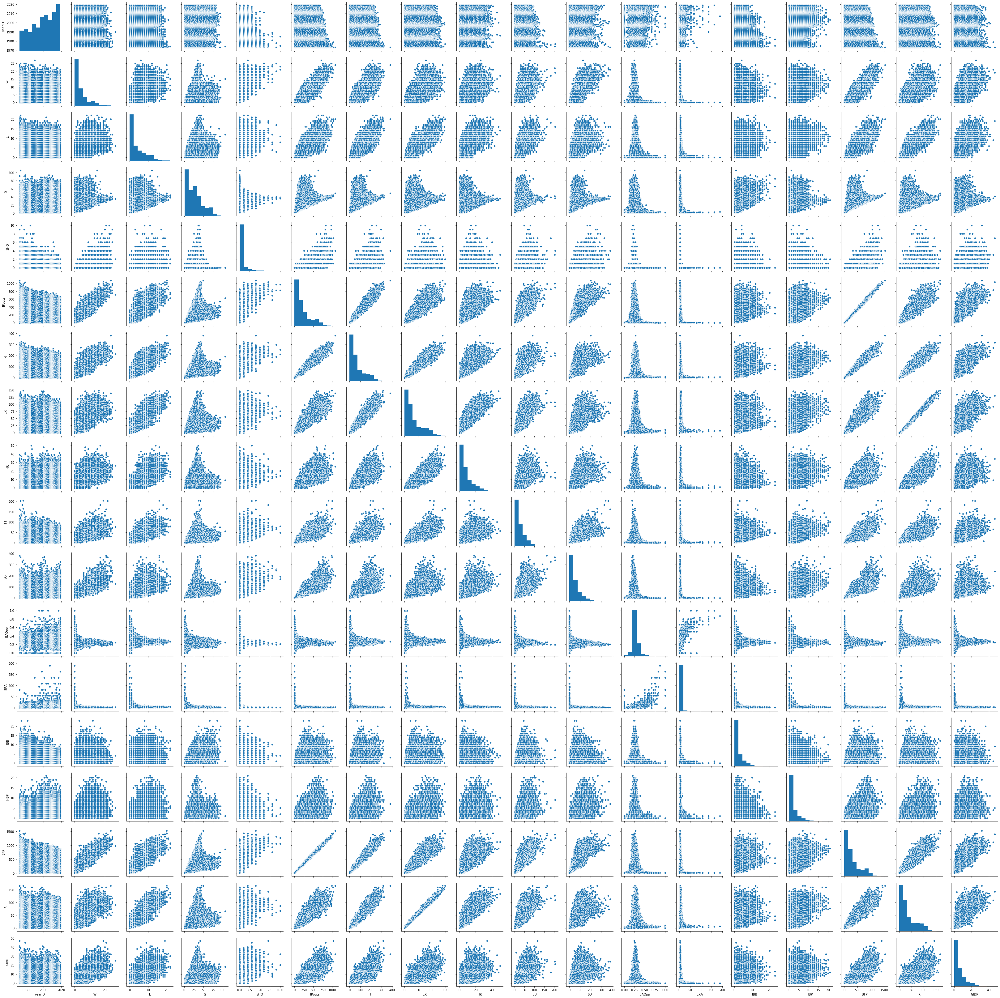

In [50]:
sns.pairplot(Pitching1)

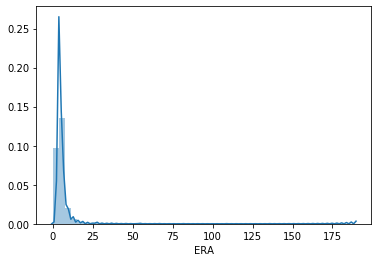

In [52]:
sns.distplot(Pitching["ERA"])

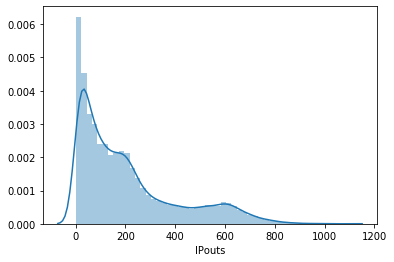

In [53]:
sns.distplot(Pitching["IPouts"])